# Allstate Claims Severity
See description, data and other details https://www.kaggle.com/competitions/allstate-claims-severity/overview

In [1]:
import pandas as pd

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score

import os

from supervised.automl import AutoML
from supervised.preprocessing.eda import EDA

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


### Get Dataset

In [2]:
data_folder = os.path.join(os.getenv('HOME'), 'Downloads', 'allstate_claim_severity_data')

train_df = pd.read_csv(os.path.join(data_folder, 'train.csv'))
test_df = pd.read_csv(os.path.join(data_folder, 'test.csv'))

In [3]:
train_df.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [4]:
test_df.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,4,A,B,A,A,A,A,A,A,B,...,0.281143,0.466591,0.317681,0.61229,0.34365,0.38016,0.377724,0.369858,0.704052,0.392562
1,6,A,B,A,B,A,A,A,A,B,...,0.836443,0.482425,0.443760,0.71330,0.51890,0.60401,0.689039,0.675759,0.453468,0.208045
2,9,A,B,A,B,B,A,B,A,B,...,0.718531,0.212308,0.325779,0.29758,0.34365,0.30529,0.245410,0.241676,0.258586,0.297232
3,12,A,A,A,A,B,A,A,A,A,...,0.397069,0.369930,0.342355,0.40028,0.33237,0.31480,0.348867,0.341872,0.592264,0.555955
4,15,B,A,A,A,A,B,A,A,A,...,0.302678,0.398862,0.391833,0.23688,0.43731,0.50556,0.359572,0.352251,0.301535,0.825823


### Data analysis

In [5]:
train_df.describe()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
mean,294135.982561,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686
std,169336.084867,0.187640,0.207202,0.202105,0.211292,0.209027,0.205273,0.178450,0.199370,0.181660,0.185877,0.209737,0.209427,0.212777,0.222488,2904.086186
min,1.000000,0.000016,0.001149,0.002634,0.176921,0.281143,0.012683,0.069503,0.236880,0.000080,0.000000,0.035321,0.036232,0.000228,0.179722,0.670000
25%,147748.250000,0.346090,0.358319,0.336963,0.327354,0.281143,0.336105,0.350175,0.312800,0.358970,0.364580,0.310961,0.311661,0.315758,0.294610,1204.460000
50%,294539.500000,0.475784,0.555782,0.527991,0.452887,0.422268,0.440945,0.438285,0.441060,0.441450,0.461190,0.457203,0.462286,0.363547,0.407403,2115.570000
75%,440680.500000,0.623912,0.681761,0.634224,0.652072,0.643315,0.655021,0.591045,0.623580,0.566820,0.614590,0.678924,0.675759,0.689974,0.724623,3864.045000
max,587633.000000,0.984975,0.862654,0.944251,0.954297,0.983674,0.997162,1.000000,0.980200,0.995400,0.994980,0.998742,0.998484,0.988494,0.844848,121012.250000


In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(1), object(116)
memory usage: 189.7+ MB


In [7]:
train_df.isna().values.sum() # checking for nas 

0

### AutoML by MlJar

In [8]:
target_var = 'loss'
X_train = train_df.drop(columns=[target_var], axis=1)
y_train = train_df[target_var]

In [9]:
# EDA.extensive_eda(X_train, y_train, save_path='.')

In [10]:
def regression_metrics(y_true, y_hat):
    print('MAE:', mean_absolute_error(y_true, y_hat))
    print('MAPE: ', mean_absolute_percentage_error(y_true, y_hat))
    print('MSE:', mean_squared_error(y_true, y_hat))
    print('RMSE:', np.sqrt(mean_squared_error(y_true, y_hat)))
    print('R2:', r2_score(y_true, y_hat))
    

In [11]:
automl = AutoML(mode="Perform", 
                ml_task='regression', 
                eval_metric='mae', 
                algorithms = ['Linear', 'Decision Tree', 'Random Forest', 'LightGBM', 'Xgboost', 'CatBoost', 'Neural Network'],
                train_ensemble = True,
                total_time_limit = 6 * 60 * 60)
automl.fit(X_train, y_train)

Linear algorithm was disabled.
AutoML directory: AutoML_1
The task is regression with evaluation metric mae
AutoML will use algorithms: ['Decision Tree', 'Random Forest', 'LightGBM', 'Xgboost', 'CatBoost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_DecisionTree mae 1511.536534 trained in 125.36 seconds (1-sample predict time 0.0917 seconds)
2_DecisionTree mae 1486.18311 trained in 120.35 seconds (1-sample predict time 0.0951 seconds)
3_DecisionTree mae 1486.18311 trained in 121.96 seconds (1-sample predict time 0.0956 seconds)
* Step default_algorithms will try to check up to 5 models
4_Default_LightGBM mae 1144.522238 trained in 195.8 seconds (1-sample predict time 0.1041 seconds)
5_Default_Xgboost mae 1146.578503 trained in 

AutoML(algorithms=['Linear', 'Decision Tree', 'Random Forest', 'LightGBM',
                   'Xgboost', 'CatBoost', 'Neural Network'],
       eval_metric='mae', ml_task='regression', mode='Perform',
       total_time_limit=21600)

In [12]:
automl.get_leaderboard().sort_values(by=['metric_value', 'single_prediction_time'])

,name,model_type,metric_type,metric_value,train_time,single_prediction_time
28,Ensemble,Ensemble,mae,1131.102500,0.43,0.4542
10,17_CatBoost,CatBoost,mae,1136.278161,2660.33,0.0497
20,19_CatBoost,CatBoost,mae,1138.645186,1496.87,0.0466
15,18_CatBoost,CatBoost,mae,1139.508151,1347.42,0.0426
5,6_Default_CatBoost,CatBoost,mae,1140.343271,1465.48,0.0446
18,15_LightGBM,LightGBM,mae,1143.083876,207.45,0.1015
8,13_LightGBM,LightGBM,mae,1144.135436,223.90,0.0993
3,4_Default_LightGBM,LightGBM,mae,1144.522238,196.89,0.1041
25,20_CatBoost,CatBoost,mae,1144.924069,677.53,0.0415
23,16_LightGBM,LightGBM,mae,1145.232324,185.10,0.0991


In [13]:
predictions = automl.predict(X_train)

In [14]:
import numpy as np
regression_metrics(y_train, predictions)

MAE: 1050.9143135776194
MAPE:  0.45524125079110817
MSE: 3067937.776174381
RMSE: 1751.552961281611
R2: 0.6362275114234534


In [15]:
# get the residual errors and observe the distribution
residuals = y_train - predictions

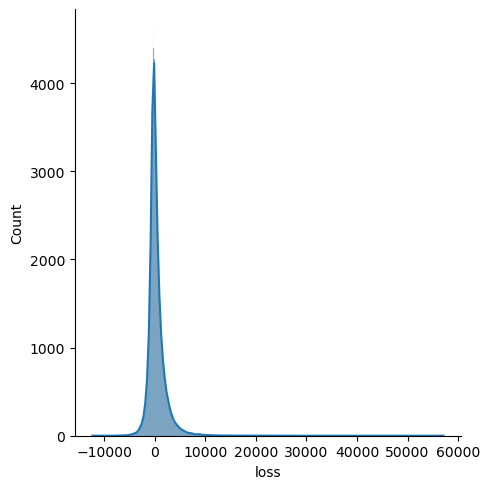

In [16]:
import seaborn as sns
sns.displot(residuals, kde=True)

### Report

In [17]:
automl.report()

Best model,name,model_type,metric_type,metric_value,train_time,single_prediction_time
,1_DecisionTree,Decision Tree,mae,1511.54,126.29,0.0917
,2_DecisionTree,Decision Tree,mae,1486.18,121.31,0.0951
,3_DecisionTree,Decision Tree,mae,1486.18,122.86,0.0956
,4_Default_LightGBM,LightGBM,mae,1144.52,196.89,0.1041
,5_Default_Xgboost,Xgboost,mae,1146.58,189.85,0.1131
,6_Default_CatBoost,CatBoost,mae,1140.34,1465.48,0.0446
,7_Default_NeuralNetwork,Neural Network,mae,1221.59,148.09,0.1364
,8_Default_RandomForest,Random Forest,mae,1384.93,579.98,0.1689
,13_LightGBM,LightGBM,mae,1144.14,223.9,0.0993
,9_Xgboost,Xgboost,mae,1148.86,166.31,0.101
